# Chameleon - Melbourne Open Playground (MOP)
# Data based - Project 10 - Urban Flood Risk Prediction Using Spatiotemporal Machine Learning

**Authored by:** Hoang Hiep Pham (224115222)

**Duration:** 90 mins

**Level:** Intermediate

**Pre-requisite skills:** Python, Pandas

# Introduction
Urbanization and climate change have significantly increased the frequency and severity of urban flooding, creating an urgent need for more sophisticated forecasting tools. Traditional hydrological models often struggle to account for the complex, non-linear interactions between heavy rainfall, aging drainage infrastructure, and varied city topographies.

This project develops an Urban Flood Risk Prediction system powered by Machine Learning to bridge this gap. By leveraging data-driven algorithms to analyze diverse datasets—including rainfall intensity, drainage capacity, and geographic features—the system identifies critical spatiotemporal patterns that precede flood events. Our primary objective is to provide accurate risk predictions that empower city planners and emergency services to improve disaster preparedness and protect vulnerable urban communities.

# Datasets Used
* Dataset 1: https://data.melbourne.vic.gov.au/explore/dataset/stormwater-pits/information/
* Dataset 2: https://data.melbourne.vic.gov.au/explore/dataset/drainpipes/information/
* Dataset 3: https://data.melbourne.vic.gov.au/explore/dataset/2023-building-footprints/information/
* Dataset 4: https://data.melbourne.vic.gov.au/explore/dataset/road-segments-with-surface-type/information/
* Dataset 5: https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2021-urban-forest/information/
* Dataset 6: https://www.bom.gov.au/jsp/ncc/cdio/weatherData/av?p_nccObsCode=136&p_display_type=dailyDataFile&p_startYear=&p_c=&p_stn_num=086338


# Workflow:
1. Data loading & Exploation
2. Data cleaning & Preprocessing
3. Spatiotemperal features creating
4. Modelling & Prediction
5. Visualisation
6. Recommendations & Conslusion



## Section 1: General setting & Data collecting

In [ ]:
# ! pip install geopandas
! pip install contextily
# ! pip install requests

In [ ]:
# import libraries
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import geopandas as gpd
import requests
from io import StringIO
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import box
from math import nan

### Collecting data

In [ ]:
# define function to colect data
def collect_data(dataset_id, limit=-1, format="csv"):
  base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
  url = f'{base_url}{dataset_id}/exports/{format}'
  params = {
      'limit': limit,
      'lang': 'en',
      'timezone': 'UTC'
  }

  try:
    response = requests.get(url, params=params)
    response.raise_for_status()

    data = StringIO(response.text)
    if format == 'geojson':
      df = gpd.read_file(data)
    else:
      df = pd.read_csv(data, delimiter=';')
    print(f'Successfully loaded {dataset_id}, {df.shape[0]} rows and {df.shape[1]} columns, {format} format.')

    return df

  except requests.exceptions.RequestException as e:
    print(f'Error loading {dataset_id}: {e}.')
    return None

# collect data from City of Melbourne Open Data Portal
pits_raw = collect_data('stormwater-pits', format='geojson')
pipes_raw = collect_data('drainpipes', format='geojson')
buildings_raw = collect_data('2023-building-footprints', format='geojson')
roads_raw = collect_data('road-segments-with-surface-type', format='geojson')
trees_raw = collect_data('tree-canopies-2021-urban-forest', format='geojson')

Successfully loaded stormwater-pits, 21113 rows and 13 columns, geojson format.
Successfully loaded drainpipes, 17242 rows and 17 columns, geojson format.
Successfully loaded 2023-building-footprints, 41701 rows and 13 columns, geojson format.
Successfully loaded road-segments-with-surface-type, 56519 rows and 10 columns, geojson format.
Successfully loaded tree-canopies-2021-urban-forest, 57980 rows and 2 columns, geojson format.


## Section 2: Data preprocessing
### 2.1 Spatial data preprocessing
#### 2.1.1 Exploring raw datasets

In [ ]:
# display head of datasets and check null values
print(f'*** Pits data: \n{pits_raw.head(3)} \n')
print(f'*** Pits null values: \n{pits_raw.isnull().sum()}\n\n')
print(f'*** Pipes data: \n{pipes_raw.head(3)} \n')
print(f'*** Pipes null values: \n{pipes_raw.isnull().sum()}\n\n')
print(f'*** Buildings data: \n{buildings_raw.head(3)} \n')
print(f'*** Buildings null values: \n{buildings_raw.isnull().sum()}\n\n')
print(f'*** Roads data: \n{roads_raw.head(3)} \n')
print(f'*** Roads null values: \n{roads_raw.isnull().sum()}\n\n')
print(f'*** Trees data: \n{trees_raw.head(3)} \n')
print(f'*** Trees null values: \n{trees_raw.isnull().sum()}\n\n')

*** Pits data: 
   asset_number          asset_description construction_material_lupvalue  \
0       1146845  SWD Pit - Grated Kerbside               In Situ Concrete   
1       1145494       SWD Pit - Side Entry               Precast Concrete   
2       1141461       SWD Pit - Grated OFK               In Situ Concrete   

   grate_length grate_material_lupvalue  grate_width  \
0        2030.0              Mild Steel        970.0   
1           0.0                    None          0.0   
2         930.0              Mild Steel        600.0   

                                model_descr_lupvalue model_no_lupvalue  \
0  SWD Pit - Grated Kerbside Pit - Non Standard F...        300404-003   
1            SWD Pit - Side Entry Pit - Unclassified        300401-000   
2  SWD Pit - Grated Overflow Kerb Pit - Exposed A...        300405-005   

  object_type_lupvalue overflow_kerb_lupvalue        lat         lon  \
0      Grated Kerbside                   None -37.796946  144.955825   
1        

#### 2.1.2 Visualising raw datasets

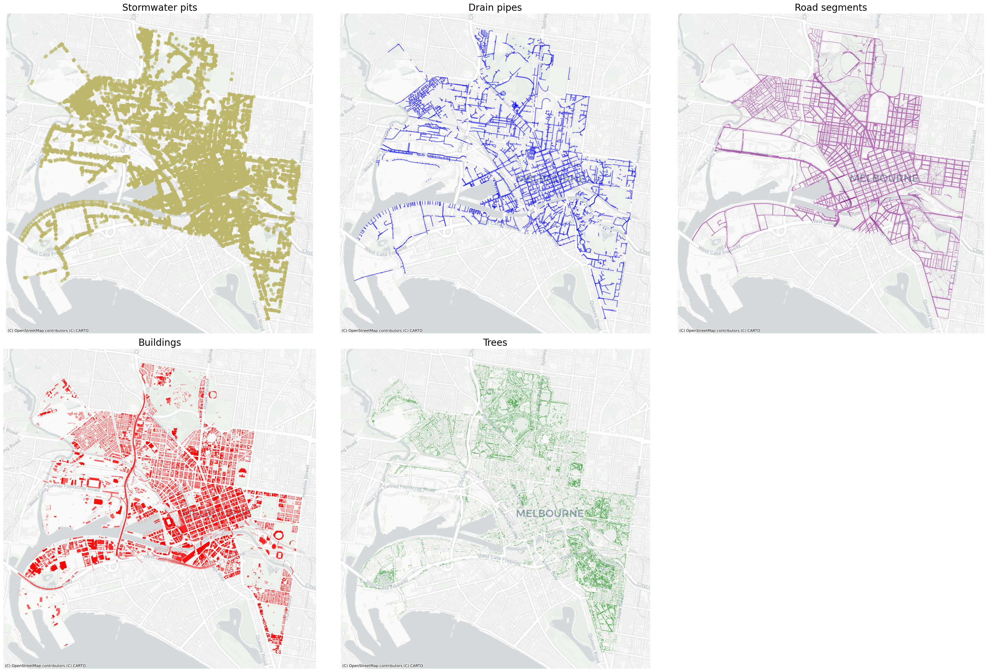

In [ ]:
# visualize data
datasets = {
    'Stormwater pits': {'df': pits_raw, 'color': 'darkkhaki'},
    'Drain pipes': {'df': pipes_raw, 'color': 'blue'},
    'Road segments': {'df': roads_raw, 'color': 'purple'},
    'Buildings': {'df': buildings_raw, 'color': 'red'},
    'Trees': {'df': trees_raw, 'color': 'green'}
}

fig, axes = plt.subplots(2, 3, figsize=(30, 20))

for i, (name, info) in enumerate(datasets.items()):
    ax = axes[i // 3, i % 3]

    df = info['df'].to_crs(epsg=3857)
    color = info['color']

    df.plot(ax=ax, color=color, alpha=0.6)
    ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron)

    ax.axis('off')
    ax.set_title(name, fontsize=20)

# remove empty subplot
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

#### 2.1.3 Spatial data handling

In [ ]:
# select nescessary data
pits = pits_raw['geometry'].drop_duplicates()
pipes = pipes_raw.dropna(subset=['diameter'])[['geometry', 'diameter']].drop_duplicates()
buildings = buildings_raw[['geometry', 'footprint_min_elevation']].drop_duplicates()
roads = roads_raw.dropna(subset=['material'])[['geometry', 'material']].drop_duplicates()
trees = trees_raw['geometry'].drop_duplicates()

# check materials
print(f'Roads material values: \n{roads['material'].unique()}')
# eliminate "other" and "not known" values
roads = roads[(roads['material'].str.lower() != "other") & (roads['material'].str.lower() != "not known")]

# score impervious values
def score_impervious(material):
    m = material.strip().lower()
    # impervious
    if any(keyword in m for keyword in [
        'concrete', 'hma', 'asphalt', 'bluestone', 'granite', 'brick',
        'steel', 'plastic', 'terrazzo', 'precast', 'pre cast',
        'cast in situ', 'cast-in-situ', 'masonry', 'iron'
    ]):
        return 0.9
    # semi-pervious
    elif any(keyword in m for keyword in [
        'crushed rock', 'gravel', 'granitec', 'granitic', 'pebble',
        'paver', 'mixture', 'timber', 'wood', 'crazy paving'
    ]):
        return 0.5
    # pervious
    elif any(keyword in m for keyword in [
        'grass', 'turf', 'plants', 'mulch', 'sand', 'unmade'
    ]):
        return 0.1
    return None

roads['impervious_score'] = roads['material'].apply(score_impervious)

print(f'\nRoads impervious score values: \n{roads['impervious_score'].unique()}')

Roads material values: 
['Dressed Bluestone' 'Granitic Gravel' 'Pre Cast Exposed Agg'
 'Cast in Situ Off Form' 'Concrete' 'HMA' 'Other Paver'
 '1 Row Bluestone Pitcher' 'Bluestone Paver (Other)' 'Brick Paver'
 'HMA Footpath (CBD)' 'Pre Cast Off Form' 'Bluestone Paver (1000x500x40)'
 'HMA Footpath (Non CBD)' 'Bluestone Pitcher' 'Concrete Paver'
 '5 Row Bluestone Pitcher' '4 Row Bluestone Pitcher'
 '3 Row Bluestone Pitcher' 'Timber' 'Cast in Situ Exposed Agg'
 '6 Row Bluestone Pitcher' '2 Row Bluestone Pitcher' 'Turf' 'Brick'
 'Sawn Bluestone Block (100x100x100)' 'Granite Paver' 'Terrazzo Paver'
 'Other' 'Mulch' 'Pebble Paving' 'Crushed Rock' 'Plants' 'Unmade'
 'Cast-In-Situ Concrete' '7 Row Bluestone Pitcher' 'Crazy Paving' 'Steel'
 'Precast Concrete' 'Wrought Iron' 'Not Known' 'Plastic/Composite'
 'HMA-Porous' '9 Row Bluestone Pitcher' 'Synthetic Turf'
 'Bluestone Triangle Paver' 'Masonry' 'Mixture of Materials' 'Woodpaving'
 'Sand' '8 Row Bluestone Pitcher' '15 Row Bluestone Pitcher' 

### 2.2 Temporal data handling

In [ ]:
# import rainfall data
rain_raw = pd.read_csv('IDCJAC0009_086338_1800_Data.csv')

# select nescessary columns and rows
rain = rain_raw[rain_raw['Year'] >= 2020]
rain['date'] = pd.to_datetime(rain[['Year', 'Month', 'Day']])
rain = rain[['date', 'Rainfall amount (millimetres)']]
rain.columns = ['date', 'rainfall']

# fill null value with 0
rain['rainfall'] = rain['rainfall'].fillna(0)

# Sort by time
rain = rain.sort_values("date").reset_index(drop=True)

# check valid rainfall values
print(f'Number of rows with values less than 0: {rain[rain["rainfall"] < 0].shape[0]}\n')

Number of rows with values less than 0: 0



## Section 3: Creating model features
### 3.1 Spatial features
#### 3.1.1 Creating geometry grid data frame & extracting spatial features

In [ ]:
# create grid data frame for spartial variables
xmin, ymin, xmax, ymax = buildings.to_crs("EPSG:28355").total_bounds
cell_size = 1000

grid_cells = []
for x in np.arange(xmin, xmax, cell_size):
  for y in np.arange(ymin, ymax, cell_size):
    grid_cells.append(box(x, y, x + cell_size, y + cell_size))
grid = gpd.GeoDataFrame(geometry = grid_cells, crs = "EPSG:28355")
grid["id"] = range(len(grid))
grid = grid[['id', 'geometry']]


## create features into grids

# pits feature
pits = gpd.GeoDataFrame(pits, geometry='geometry')
pits = pits.to_crs(grid.crs)
pits_joined = gpd.sjoin(pits, grid, how="inner", predicate="intersects")
pits_features = (
    pits_joined.groupby("id").size()
    .reset_index(name="pit_count")
)
grid = grid.merge(pits_features, on='id', how='left')

# trees feature
trees = gpd.GeoDataFrame(trees, geometry='geometry')
trees = trees.to_crs(grid.crs)
trees_joined = gpd.sjoin(trees, grid, how="inner", predicate="intersects")
trees_features = (
    trees_joined.groupby("id").size()
    .reset_index(name="tree_count")
)
grid = grid.merge(trees_features, on='id', how='left')

# pipes feature
pipes = pipes.to_crs(grid.crs)
pipes_joined = gpd.sjoin(pipes, grid, how="inner", predicate="intersects")
pipes_features = (
    pipes_joined.groupby("id").agg(
        pipe_count=("geometry", "count"),
        avg_diameter=("diameter", "mean")
    ).reset_index()
)
grid = grid.merge(pipes_features, on='id', how='left')

# buildings feature
buildings = buildings.to_crs(grid.crs)
buildings_joined = gpd.sjoin(buildings, grid, how="inner", predicate="intersects")
buildings_features = (
    buildings_joined.groupby("id").agg(
        building_count=("geometry", "count"),
        avg_min_elevation=("footprint_min_elevation", "mean")
    ).reset_index()
)
grid = grid.merge(buildings_features, on='id', how='left')

# roads feature
roads = roads.to_crs(grid.crs)
roads_joined = gpd.sjoin(roads, grid, how="inner", predicate="intersects")
roads_features = (
    roads_joined.groupby("id").agg(
        road_count=("geometry", "count"),
        avg_impervious_score=("impervious_score", "mean")
    ).reset_index()
)
grid = grid.merge(roads_features, on='id', how='left')

# drop grid with nan values
grid = grid[~grid['building_count'].isna()].reset_index(drop=True)
grid = grid.fillna(0)

print(f'Spatio data: \n{grid.head(5)}\n')

Spatio data: 
   id                                           geometry  pit_count  \
0   0  POLYGON ((316043.867 5808852.655, 316043.867 5...        0.0   
1   1  POLYGON ((316043.867 5809852.655, 316043.867 5...       13.0   
2   2  POLYGON ((316043.867 5810852.655, 316043.867 5...       97.0   
3   3  POLYGON ((316043.867 5811852.655, 316043.867 5...        0.0   
4   4  POLYGON ((316043.867 5812852.655, 316043.867 5...       74.0   

   tree_count  pipe_count  avg_diameter  building_count  avg_min_elevation  \
0        43.0         1.0         0.000             3.0           2.600000   
1       924.0        13.0         0.000            58.0           2.791379   
2       826.0        80.0       448.125           189.0           5.691005   
3        62.0         0.0         0.000            90.0           2.780000   
4        93.0        42.0       237.500            36.0           3.694444   

   road_count  avg_impervious_score  
0         0.0              0.000000  
1         0.0 

#### 3.1.2 Visualising cleaned spartial datasets on grid areas

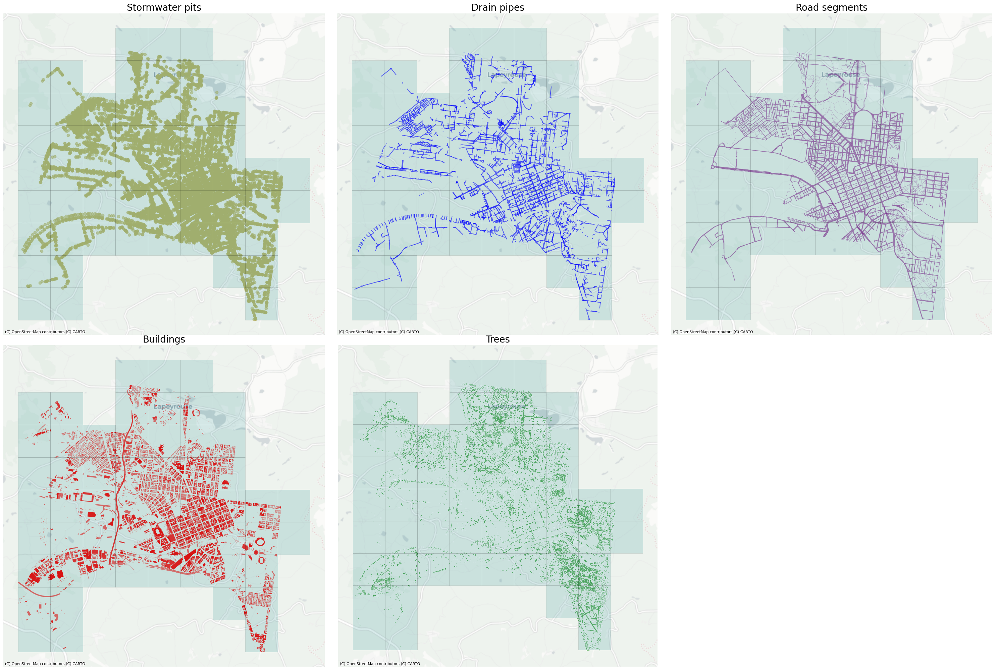

In [ ]:
datasets = {
    'Stormwater pits': {'df': pits, 'color': 'darkkhaki'},
    'Drain pipes': {'df': pipes, 'color': 'blue'},
    'Road segments': {'df': roads, 'color': 'purple'},
    'Buildings': {'df': buildings, 'color': 'red'},
    'Trees': {'df': trees, 'color': 'green'}
}
fig, axes = plt.subplots(2, 3, figsize=(30, 20))
for i, (name, info) in enumerate(datasets.items()):
    ax = axes[i // 3, i % 3]
    df = info['df']
    color = info['color']
    df.plot(ax=ax, color=color, alpha=0.6)
    grid.plot(ax=ax, color='teal', alpha=0.15, edgecolor='black', linewidth=0.5)
    ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron)
    ax.axis('off')
    ax.set_title(name, fontsize=20)
axes[1, 2].axis('off')
plt.tight_layout()
plt.show()

### 3.2 Temporal features

In [ ]:
# create accumulation rainfall
rain['rain_2days'] = rain['rainfall'].rolling(window=2).sum()
rain['rain_3days'] = rain['rainfall'].rolling(window=3).sum()
rain['rain_4days'] = rain['rainfall'].rolling(window=4).sum()
rain['rain_5days'] = rain['rainfall'].rolling(window=5).sum()
rain = rain[(rain['date'] >= '2024-01-01') & (rain['date'] <= '2025-12-31')]
rain = rain.reset_index(drop=True)

print(f'Temporal data: \n{rain}\n')

Temporal data: 
          date  rainfall  rain_2days  rain_3days  rain_4days  rain_5days
0   2024-01-01       0.0         0.6         0.6         0.6         1.4
1   2024-01-02       0.0         0.0         0.6         0.6         0.6
2   2024-01-03      17.8        17.8        17.8        18.4        18.4
3   2024-01-04       1.0        18.8        18.8        18.8        19.4
4   2024-01-05       0.0         1.0        18.8        18.8        18.8
..         ...       ...         ...         ...         ...         ...
726 2025-12-27       0.0         0.0         0.0         0.0         0.0
727 2025-12-28       0.0         0.0         0.0         0.0         0.0
728 2025-12-29       0.0         0.0         0.0         0.0         0.0
729 2025-12-30       0.0         0.0         0.0         0.0         0.0
730 2025-12-31       0.0         0.0         0.0         0.0         0.0

[731 rows x 6 columns]



### 3.3 Finalising training data

In [ ]:
# merge data
spatioltemporal_df = grid.merge(rain, how='cross')
print(f'Spatiotemporal data: \n{spatioltemporal_df}\n')

Spatiotemporal data: 
       id                                           geometry  pit_count  \
0       0  POLYGON ((316043.867 5808852.655, 316043.867 5...        0.0   
1       0  POLYGON ((316043.867 5808852.655, 316043.867 5...        0.0   
2       0  POLYGON ((316043.867 5808852.655, 316043.867 5...        0.0   
3       0  POLYGON ((316043.867 5808852.655, 316043.867 5...        0.0   
4       0  POLYGON ((316043.867 5808852.655, 316043.867 5...        0.0   
...    ..                                                ...        ...   
40931  76  POLYGON ((324043.867 5812852.655, 324043.867 5...       94.0   
40932  76  POLYGON ((324043.867 5812852.655, 324043.867 5...       94.0   
40933  76  POLYGON ((324043.867 5812852.655, 324043.867 5...       94.0   
40934  76  POLYGON ((324043.867 5812852.655, 324043.867 5...       94.0   
40935  76  POLYGON ((324043.867 5812852.655, 324043.867 5...       94.0   

       tree_count  pipe_count  avg_diameter  building_count  \
0            4

## 4. Training model